# Import

In [1]:
from datetime import datetime
from time import time
import os

import geopandas as gpd
from geopandas.plotting import plot_polygon_collection, plot_dataframe
import pandas as pd
import seaborn as sns

import matplotlib as mp
from matplotlib import pyplot as plt
from matplotlib.collections import LineCollection

import numpy as np
import pysal as ps
import random as rdm
from pysal.contrib.viz import mapping as maps

import maputils

sns.set()
sns.set_style('white')

/home/sbuss/envs/sf-311/local/lib/python2.7/site-packages/pysal/contrib/viz/mapping.py:33: UserWarning: Bokeh not installed. Functionality related to it will not work
  warn('Bokeh not installed. Functionality ' \


# Data Loading

In [2]:
threeoneone_map = "https://data.sfgov.org/api/views/vw6y-z8j6/rows.tsv?accessType=DOWNLOAD&bom=true"

In [3]:
blocks = gpd.read_file("gzip://%s" % os.path.realpath("gis/blocks/blocks-with-supervisor-district.geojson.gz")).to_crs({'init': 'epsg:4326'})
d6_blocks = blocks[blocks.supervisor == 6]
districts = gpd.read_file("gis/supervisor-districts/Elect_Supervisor_Dists.shp").to_crs({'init': 'epsg:4326'})
d6 = districts[districts.supervisor == 6]

In [4]:
#cases = pd.read_csv("311/311_Cases.tsv", delimiter="\t", parse_dates=['Opened', 'Closed', 'Updated'], infer_datetime_format=True)
cases = pd.read_pickle("data/311/311_Cases.pickle")

In [5]:
from geopandas import GeoDataFrame
from shapely.geometry import Point

cases_2017 = cases[(cases['Opened'] >= datetime(2017,1,1)) & (cases['Opened'] < datetime(2018,1,1)) & (cases['Longitude'] < 100) & (cases['Latitude'] > 37.7)]
geometry = [Point(xy) for xy in zip(cases_2017.Longitude, cases_2017.Latitude)]
#df = df.drop(['Lon', 'Lat'], axis=1)
crs = {'init': 'epsg:4326'}
gdf = GeoDataFrame(cases_2017, crs=crs, geometry=geometry)

In [6]:
d6_cases = cases[cases['Supervisor District'] == 6]

In [7]:
d6_cases.columns

Index([u'CaseID', u'Opened', u'Closed', u'Updated', u'Status', u'Status Notes',
       u'Responsible Agency', u'Category', u'Request Type', u'Request Details',
       u'Address', u'Supervisor District', u'Neighborhood', u'Police District',
       u'Latitude', u'Longitude', u'Point', u'Source', u'Media URL'],
      dtype='object')

# Exploration

In [8]:
for x in sorted(d6_cases['Request Type'].unique()):
    print("    '%s'," % x)

    'Abandoned Vehicle -',
    'Abandoned Vehicle - Car2door',
    'Abandoned Vehicle - Car4door',
    'Abandoned Vehicle - Motorcycle',
    'Abandoned Vehicle - Other',
    'Abandoned Vehicle - PickupTruck',
    'Abandoned Vehicle - SUV',
    'Abandoned Vehicle - Trailer',
    'Abandoned Vehicles',
    'Add_remove_garbage_can',
    'Adopt_A_Street',
    'Automotive',
    'Blocked Sidewalk and Parking',
    'Blocked_Parking_Space_or_Strip',
    'Blocked_Sidewalk',
    'Blocked_Street_Sidewalk',
    'Blue Color Curb Request',
    'Building - Bathroom',
    'Building - Blocked_Exit_Common_Areas',
    'Building - Clutter_Hoarder_Unit_Interior_Storage',
    'Building - Deck_Stairs_Handrails',
    'Building - Doors_Windows_Broken_Defective',
    'Building - Electrical_Hazardous_Condition',
    'Building - Electrical_Non_Hazard',
    'Building - Elevators_Everthing_Else',
    'Building - Elevators_No_Working_Elevator_7_or_More_Stories',
    'Building - Fire_Alarm_System',
    'Building - Fir

In [9]:
types_of_interest = [
    'Community_Clean_Team',
    'Damaged_Property',
    'Encampment Reports',
    'Encampment items',
    'Garbage',
    'Graffiti',
    'Graffiti on ATT_Property',
    'Graffiti on Bike_rack',
    'Graffiti on Bridge',
    'Graffiti on Building - Commercial',
    'Graffiti on Building_commercial',
    'Graffiti on Building_other',
    'Graffiti on Building_residential',
    'Graffiti on City_receptacle',
    'Graffiti on Fire_Police_Callbox',
    'Graffiti on Fire_call_box',
    'Graffiti on Fire_hydrant',
    'Graffiti on Fire_hydrant_puc',
    'Graffiti on Mail_box',
    'Graffiti on News_rack',
    'Graffiti on Other',
    'Graffiti on Other_enter_additional_details_below',
    'Graffiti on Other_for_Parks_ONLY',
    'Graffiti on Parking_meter',
    'Graffiti on Pay_phone',
    'Graffiti on Pole',
    'Graffiti on Private Property',
    'Graffiti on Public Property',
    'Graffiti on Sidewalk_in_front_of_property',
    'Graffiti on Sidewalk_structure',
    'Graffiti on Sign',
    'Graffiti on Sign_other',
    'Graffiti on Signal_box',
    'Graffiti on Street',
    'Graffiti on Transit_Shelter_Platform',
    'Graffiti_Watch',    
    'Hazardous Materials',
    'Human Waste',
    'Human/Animal Waste',
    'Medical Waste',
    'Medical_waste',
    'followup_request',  # May be interesting to know who gets ignored?   
]

In [10]:
len(d6_cases)

360228

In [11]:
len(d6_cases[d6_cases['Request Type'].isin(types_of_interest)])

146754

In [12]:
cases[cases['Opened'] > datetime(2017,1,1)].head()

,CaseID,Opened,Closed,Updated,Status,Status Notes,Responsible Agency,Category,Request Type,Request Details,Address,Supervisor District,Neighborhood,Police District,Latitude,Longitude,Point,Source,Media URL
2175515,6715703,2017-01-10 23:08:25,NaT,2017-01-10 23:08:25,Open,Open,SFFD Other Queue,General Request - FIRE DEPARTMENT,complaint,sffd_other - complaint,Not associated with a specific address,NaN,NaN,NaN,0.0,0.0,NaN,Web,NaN
2180050,6715710,2017-01-10 23:15:53,2017-01-18 11:21:55,2017-01-18 11:21:55,Closed,NaN,District Attorney - G,General Request - DISTRICT ATTORNEY,complaint,district_attorney - complaint,Not associated with a specific address,NaN,NaN,NaN,0.0,0.0,NaN,Web,NaN
2180490,6719942,2017-01-11 19:23:53,2017-01-18 14:48:56,2017-01-18 14:48:56,Closed,NaN,MUNI Work Queue,MUNI Feedback,MUNI - Conduct_Inattentiveness_Negligence,201_Pass_Up_Did_Not_Wait_for_Transferee,Not associated with a specific address,NaN,NaN,NaN,0.0,0.0,NaN,Phone,NaN
2180885,6719973,2017-01-11 19:40:49,2017-01-18 14:49:26,2017-01-18 14:49:26,Closed,NaN,SSP - MTA Feedback Queue,MUNI Feedback,MUNI - Services_Service_Delivery_Facilities,601_Delay_No_Show,Not associated with a specific address,NaN,NaN,NaN,0.0,0.0,NaN,Web,NaN
2180917,6730264,2017-01-14 18:43:36,2017-01-17 09:32:27,2017-01-17 09:32:27,Closed,NaN,SFMTA - Citations/Resident Parking Permits - G,General Request - MTA,compliment,parking_meter_cards - compliment,Not associated with a specific address,NaN,NaN,NaN,0.0,0.0,NaN,Web,NaN


# Trends over time

/home/sbuss/envs/sf-311/lib/python2.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/home/sbuss/envs/sf-311/local/lib/python2.7/site-packages/pandas/core/groupby/groupby.py:4658: FutureWarning: using a dict with renaming is deprecated and will be removed in a future version
  return super(DataFrameGroupBy, self).aggregate(arg, *args, **kwargs)


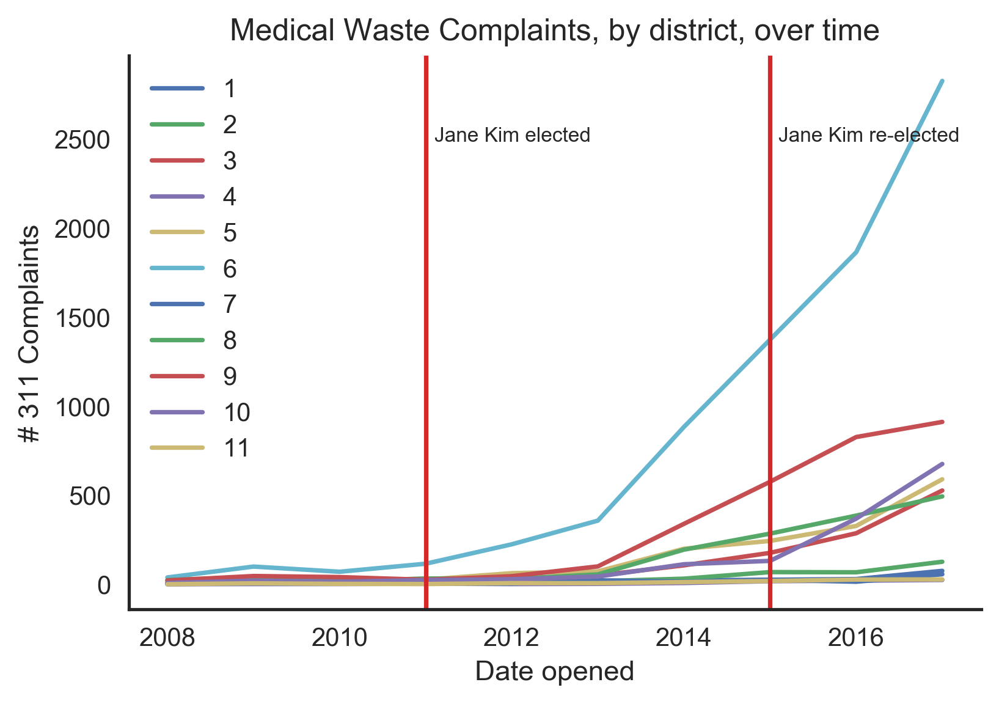

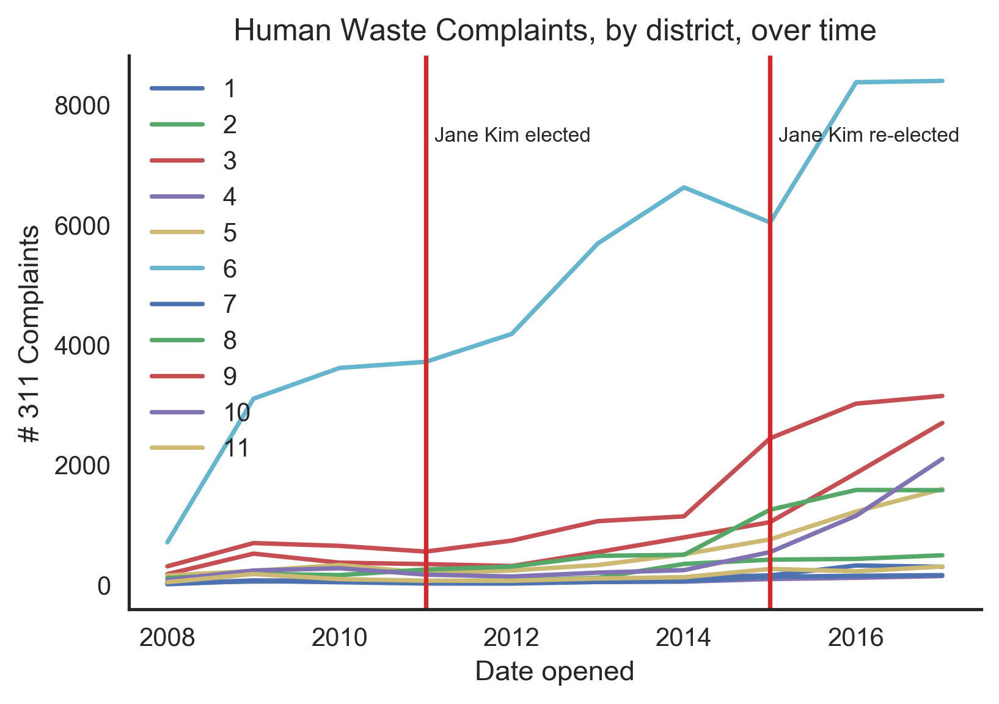

In [13]:
def all_districts(cases, start_year, end_year, request_types):
    q = cases[(cases['Supervisor District'] > 0) &
              (cases['Opened'] > datetime(start_year, 1, 1)) &
              (cases['Opened'] <= datetime(end_year, 1, 1)) &
              (cases['Request Type'].isin(request_types))]
    q['Supervisor District'] = q['Supervisor District'].astype(int)
    r = q.groupby([q.Opened.dt.year, 'Supervisor District', 'Request Type']).aggregate({
        'Request Type': {
            'total': 'count',
        }
    })

    fig, ax = plt.subplots(1)
    fig.set_size_inches(6, 4)
    fig.set_dpi(300)
    totals = r['Request Type']['total'].unstack([-2, -1])
    p = totals.plot(ax=ax)
    p.legend(totals.stack().columns.tolist())
    p.set_title("%s Complaints, by district, over time" % " & ".join(request_types))
    p.set_ylabel("# 311 Complaints")
    p.set_xlabel("Date opened")
    p.axvline(2011, color='tab:red')
    miny, maxy = ax.get_ylim()
    p.text(2011.1, (maxy-miny) * 0.8, 'Jane Kim elected' ,fontsize=8)
    
    p.axvline(2015, color='tab:red')
    miny, maxy = ax.get_ylim()
    p.text(2015.1, (maxy-miny) * 0.8, 'Jane Kim re-elected' ,fontsize=8)
    return fig

fig = all_districts(cases, 2008, 2018, ["Medical Waste"])
sns.despine()
fig.savefig("figs/medical-waste-over-time-by-district.png", dpi=300, bbox_inches='tight')

fig = all_districts(cases, 2008, 2018, ["Human Waste"])
sns.despine()
fig.savefig("figs/human-waste-over-time-by-district.png", dpi=300, bbox_inches='tight')

/home/sbuss/envs/sf-311/lib/python2.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


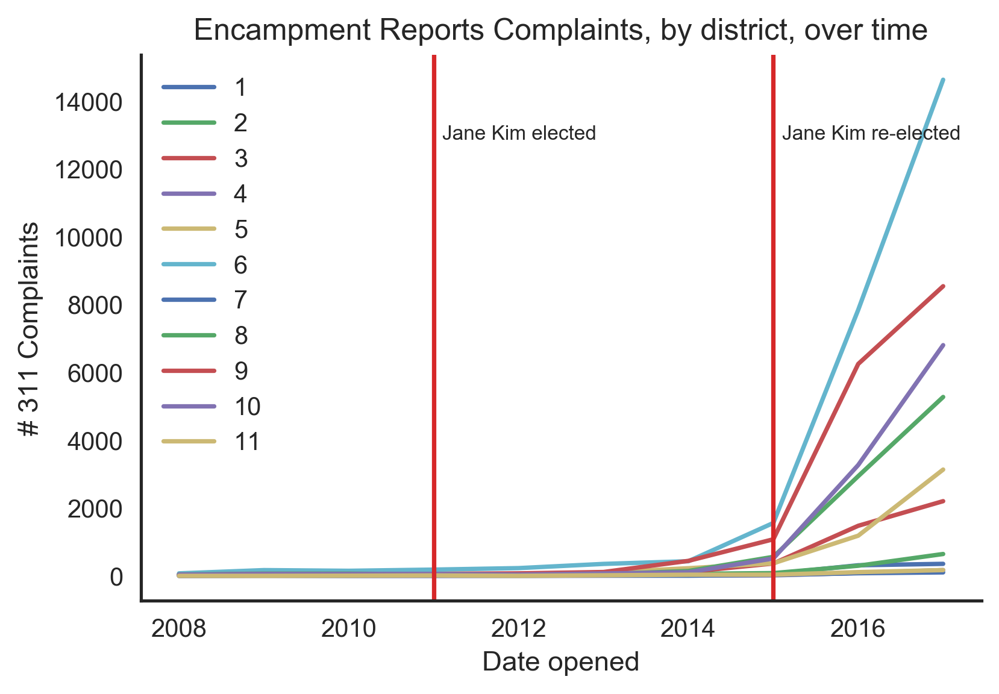

In [14]:
fig = all_districts(cases, 2008, 2018, ["Encampment Reports"])
sns.despine()
fig.savefig("figs/encampment-reports-over-time-by-district.png", dpi=300, bbox_inches='tight')

# Top complaints

In [8]:
import pandas as pd
import matplotlib.pyplot as plt

def lollipop_chart(cases, district, start_year, end_year):
    start_date = datetime(start_year,1,1)
    end_date = datetime(end_year,1,1)
    start_cases = cases[
        (cases['Supervisor District'] == district) &
        (cases['Opened'] >= start_date) &
        (cases['Opened'] < start_date.replace(year=start_date.year + 1))]
    end_cases = cases[
        (cases['Supervisor District'] == district) &
        (cases['Opened'] >= end_date) &
        (cases['Opened'] < end_date.replace(year=end_date.year + 1))]

    start_values = start_cases.groupby([start_cases.Opened.dt.year, 'Request Type'], group_keys=False).aggregate({
        'Request Type': 'count'
    }).loc[start_date.year]
    end_values = end_cases.groupby([end_cases.Opened.dt.year, 'Request Type'], group_keys=False).aggregate({
        'Request Type': 'count'
    }).loc[end_date.year]

    new_data = []
    start_dict = start_values.to_dict()['Request Type']
    end_dict = end_values.to_dict()['Request Type']
    keys = set(start_dict.keys() + end_dict.keys())
    # TODO: things without a pair get scatter-plotted by themselves
    for key in keys:
        start = start_dict.get(key, 0.1)
        end = end_dict.get(key, 0.1)
        new_data.append((key, [start, end]))
    df = pd.DataFrame({
        'Request Type': [xx[0] for xx in new_data],
        start_date.year: [xx[1][0] for xx in new_data],
        end_date.year:[xx[1][1] for xx in new_data]
    })
    ordered_df = df.nlargest(20, end_date.year).sort_values(by=end_date.year)
    my_range=range(1,len(ordered_df.index)+1)
    fig, ax = plt.subplots(1)
    fig.set_size_inches(8, 11)
    fig.set_dpi(300)
    #plt.xscale('log', basex=10, nonposx='clip')
    #ax.set_xlim(0.1, 2800, emit=False, auto=False)
    plt.hlines(y=my_range, xmin=ordered_df[start_date.year], xmax=ordered_df[end_date.year], color='grey', alpha=0.4)
    plt.scatter(ordered_df[start_date.year], my_range, color='skyblue', alpha=1, label=start_date.year)
    plt.scatter(ordered_df[end_date.year], my_range, color='green', alpha=0.4 , label=end_date.year)
    plt.legend()

    # Add title and axis names
    plt.yticks(my_range, ordered_df['Request Type'])
    plt.title("311 Complaints, D%s, change from %s to %s" % (district, start_date.year, end_date.year), loc='left')
    plt.xlabel('Number of requests')
    plt.ylabel('')
    return fig

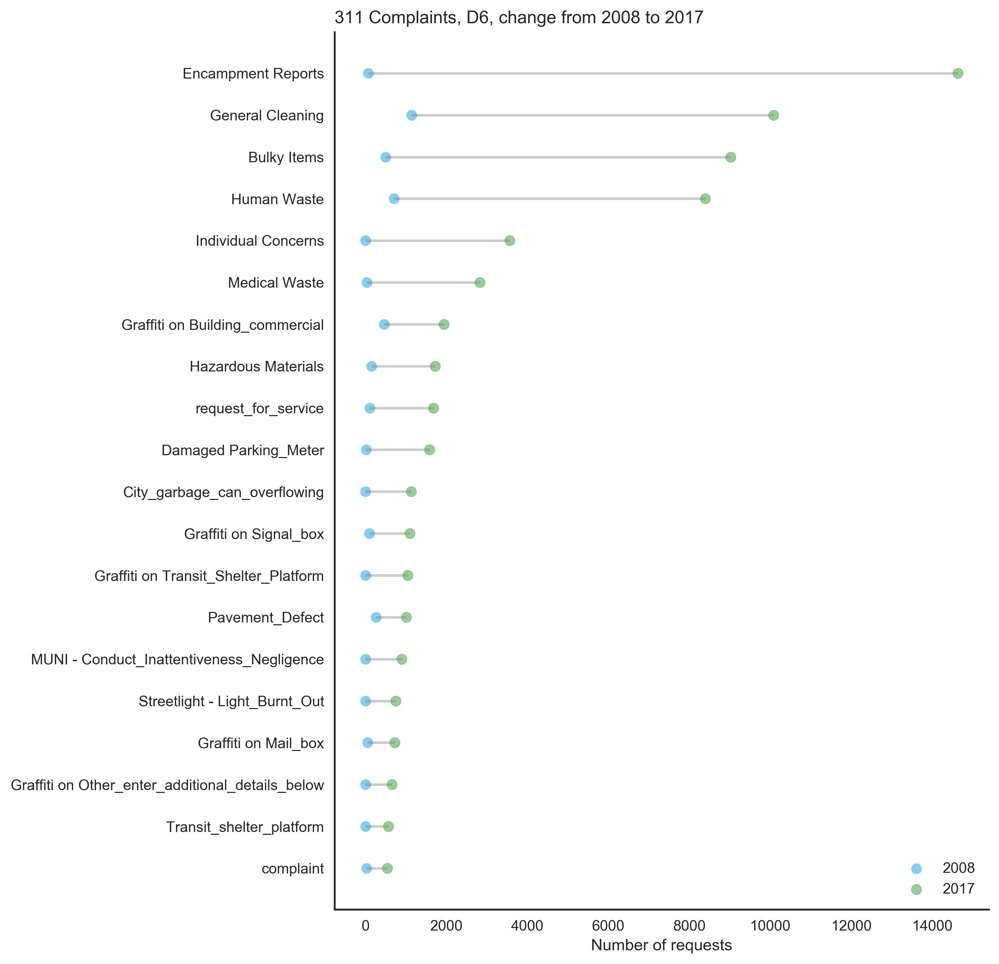

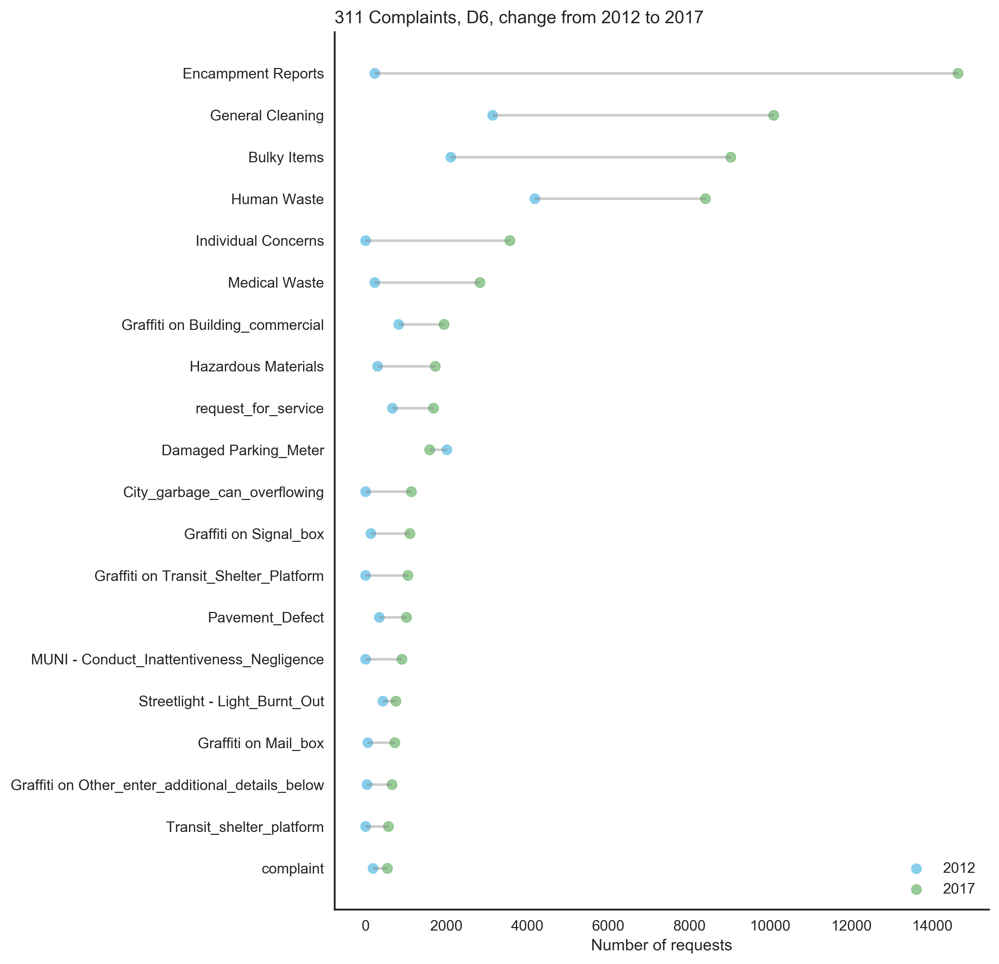

In [9]:
with sns.axes_style('white'):
    fig = lollipop_chart(cases, 6, 2008, 2017)
    sns.despine()
fig.savefig("figs/lollipop-311-2008-to-2017.png", dpi=300, bbox_inches='tight')
with sns.axes_style('white'):
    fig = lollipop_chart(cases, 6, 2012, 2017)
    sns.despine()
fig.savefig("figs/lollipop-311-2012-to-2017.png", dpi=300, bbox_inches='tight')

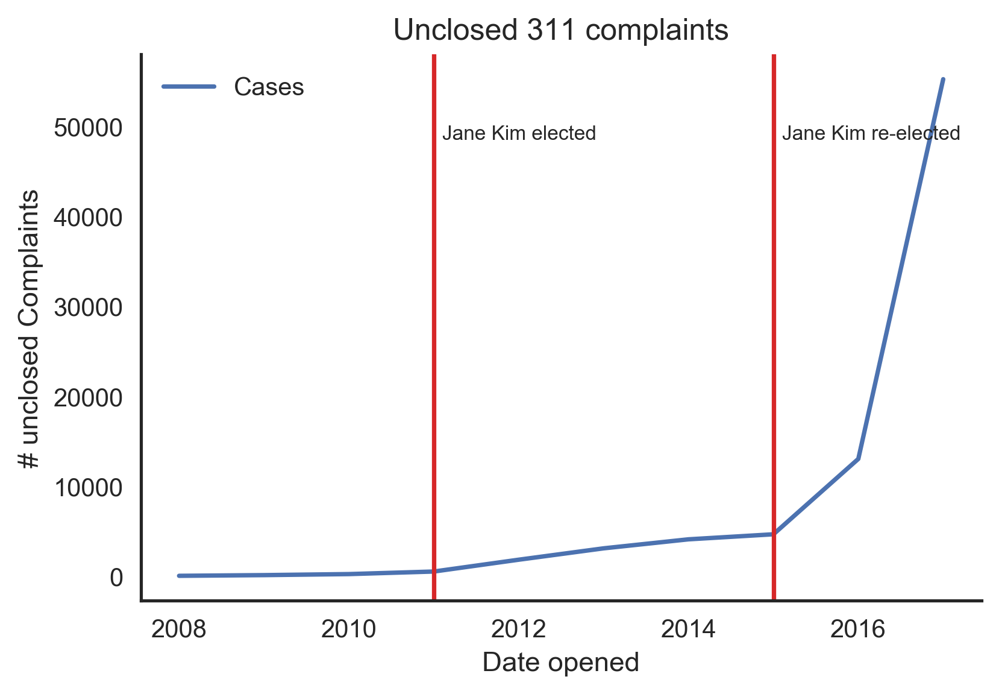

In [17]:
c = cases[pd.isnull(cases['Closed']) & (cases['Opened'] < datetime(2018,1,1))]
agg = c.groupby([cases.Opened.dt.year]).aggregate({'CaseID':'count'})
agg.columns=["Cases"]

fig, ax = plt.subplots(1)
fig.set_size_inches(6, 4)
fig.set_dpi(300)
p = agg.plot(ax=ax)
p.set_title("Unclosed 311 complaints")
p.set_xlabel("Date opened")
p.set_ylabel("# unclosed Complaints")
p.axvline(2011, color='tab:red')
miny, maxy = ax.get_ylim()
p.text(2011.1, (maxy-miny) * 0.8, 'Jane Kim elected' ,fontsize=8)
p.axvline(2015, color='tab:red')
p.text(2015.1, (maxy-miny) * 0.8, 'Jane Kim re-elected' ,fontsize=8)
sns.despine()
fig.savefig("figs/unclosed.png", dpi=300, bbox_inches='tight')

# 311 Complaint Heatmaps

maputils.py:56: RuntimeWarning: divide by zero encountered in log
  logheatmap = np.log(heatmap)


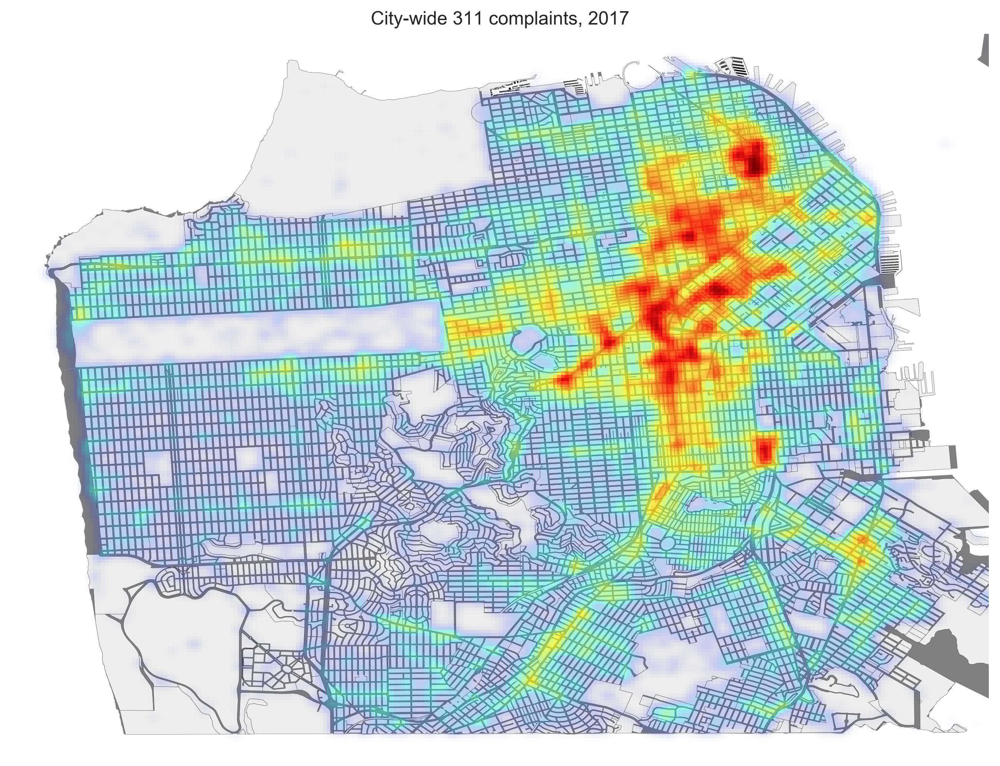

In [18]:
f = plt.figure()
ax = f.gca()
ax.set_title('City-wide 311 complaints, 2017')
plot_dataframe(districts, ax=ax, facecolor='grey', zorder=0)
plot_dataframe(blocks, ax=ax, facecolor='#eeeeee', edgecolor='black', linewidth=0.1, zorder=1)
maputils.heatmap(gdf[pd.notnull(gdf['geometry'])], bins=(256, 256), zorder=2)
maputils.frame_mainland(ax)
f.set_size_inches(10, 7)
maputils.save_map(f, ax, "figs/citywide-311-heatmap.png")

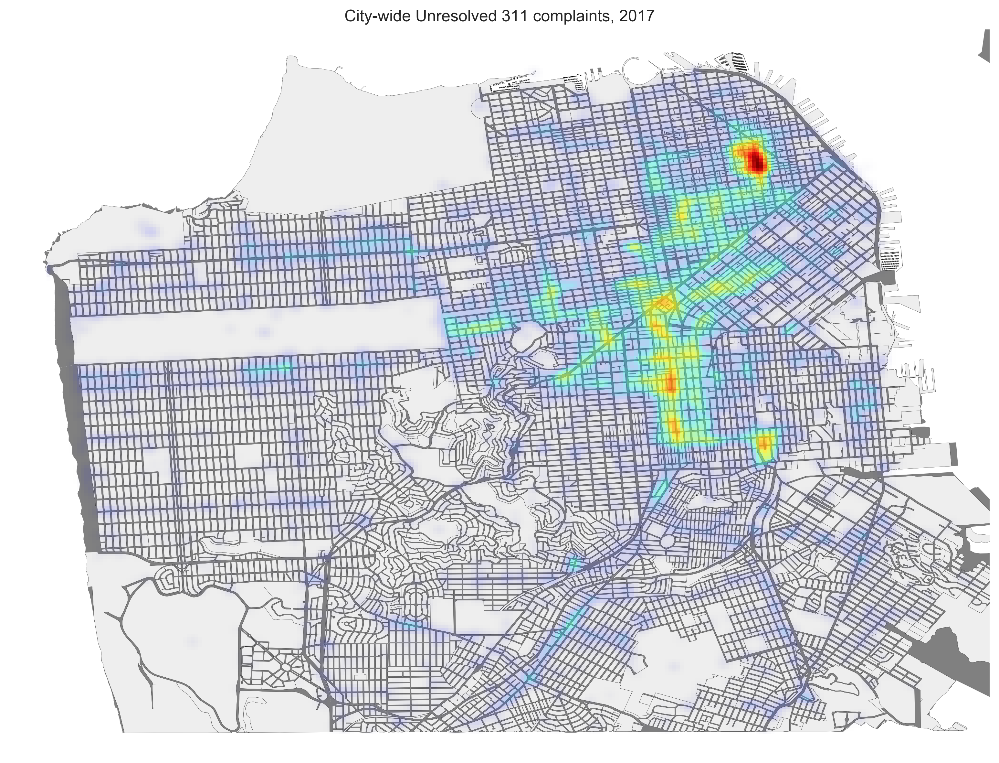

In [19]:
f = plt.figure()
ax = f.gca()
ax.set_title('City-wide Unresolved 311 complaints, 2017')
plot_dataframe(districts, ax=ax, facecolor='grey', zorder=0)
plot_dataframe(blocks, ax=ax, facecolor='#eeeeee', edgecolor='black', linewidth=0.1, zorder=1)
maputils.heatmap(gdf[pd.notnull(gdf['geometry']) & pd.isnull(gdf.Closed)], bins=(256, 256), zorder=2)
maputils.frame_mainland(ax)
f.set_size_inches(11, 8)
f.set_dpi(300)
maputils.save_map(f, ax, "figs/citywide-unresolved-311-heatmap.png")

In [20]:
def d6_heatmap(data, title, bins=(192, 192)):
    f = plt.figure()
    ax = f.gca()
    ax.set_title(title)
    plot_dataframe(d6, ax=ax, facecolor='grey', zorder=0)
    plot_dataframe(d6_blocks, ax=ax, facecolor='#eeeeee', edgecolor='black', linewidth=0.1, zorder=1)
    maputils.heatmap(data, bins=bins, zorder=2)
    maputils.frame_soma(ax)
    return f, ax

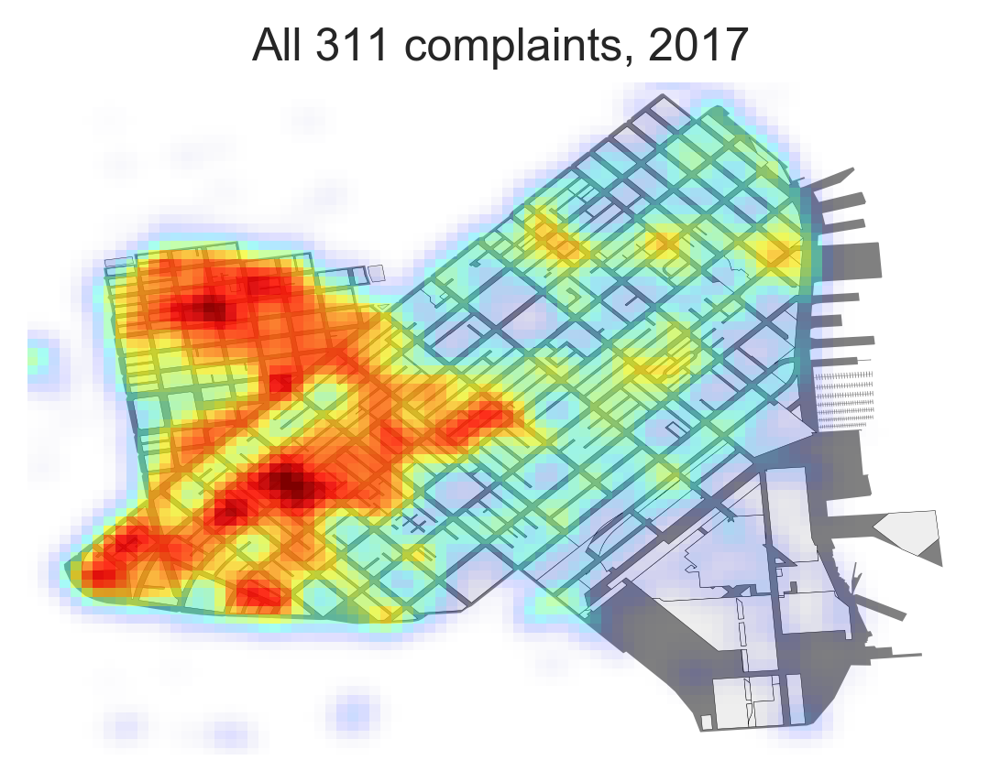

In [21]:
dd = gdf[gdf['Supervisor District'] == 6]

f, ax = d6_heatmap(dd, 'All 311 complaints, 2017', bins=(256, 256))
f.set_size_inches(4, 6)
maputils.save_map(f, ax, "figs/heatmap-2017-all.png")

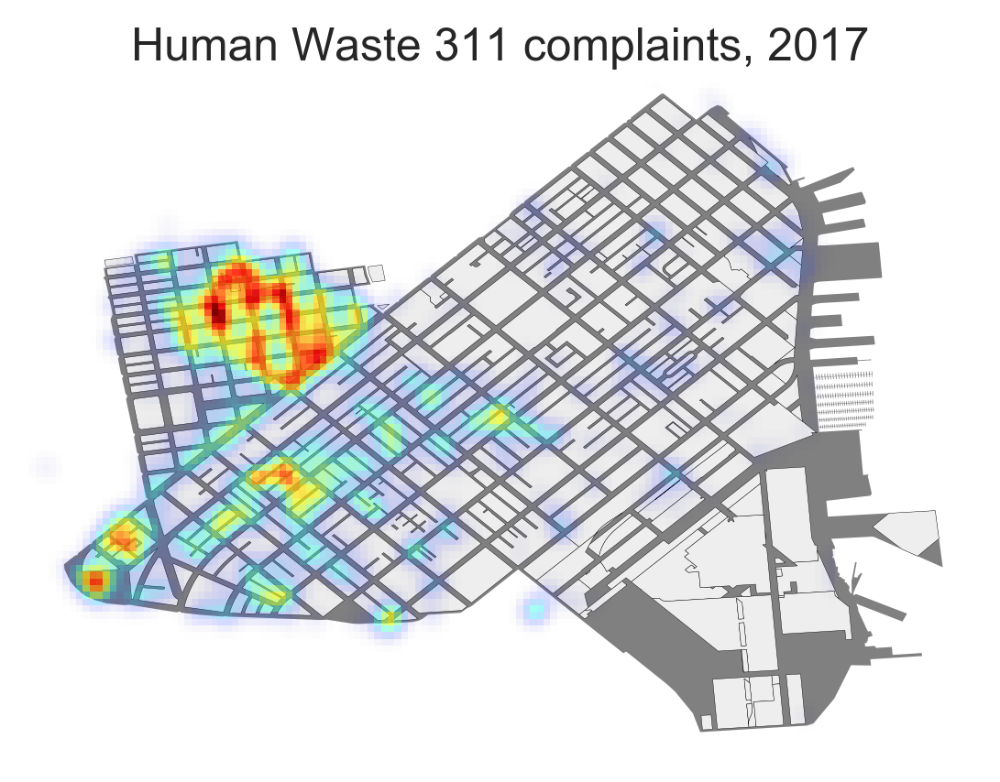

In [22]:
dd = gdf[gdf['Supervisor District'] == 6]

f, ax = d6_heatmap(dd[dd['Request Type'] == 'Human Waste'], 'Human Waste 311 complaints, 2017', bins=(256, 256))
f.set_size_inches(4, 6)
maputils.save_map(f, ax, "figs/heatmap-2017-human-waste.png")

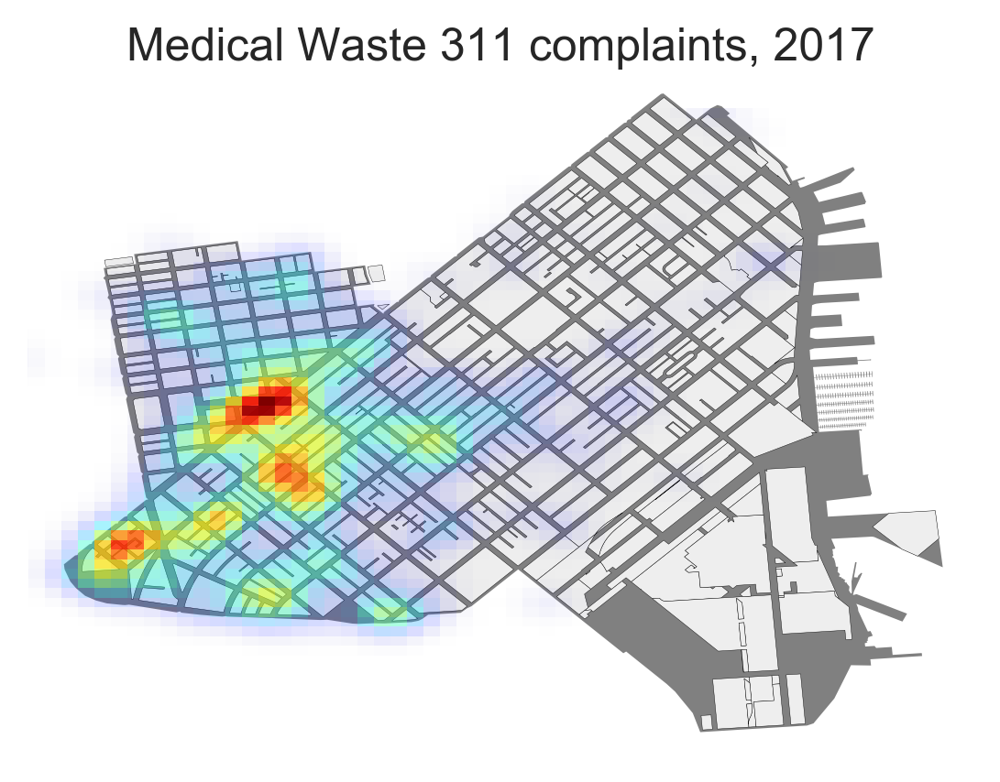

In [23]:
dd = gdf[gdf['Supervisor District'] == 6]

f, ax = d6_heatmap(dd[dd['Request Type'] == 'Medical Waste'], 'Medical Waste 311 complaints, 2017', bins=(64, 64))
f.set_size_inches(4, 6)
maputils.save_map(f, ax, "figs/heatmap-2017-medical-waste.png")

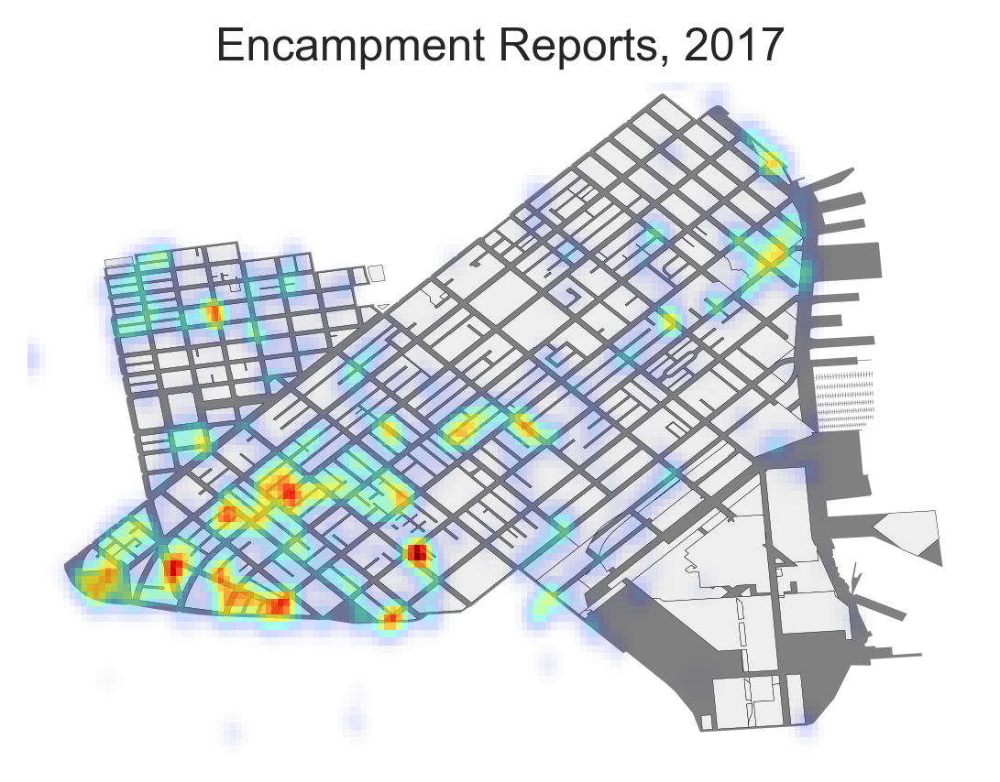

In [24]:
dd = gdf[gdf['Supervisor District'] == 6]

f, ax = d6_heatmap(dd[dd['Request Type'] == 'Encampment Reports'], 'Encampment Reports, 2017', bins=(192, 192))
f.set_size_inches(4, 6)
maputils.save_map(f, ax, "figs/heatmap-2017-encampment-reports.png")

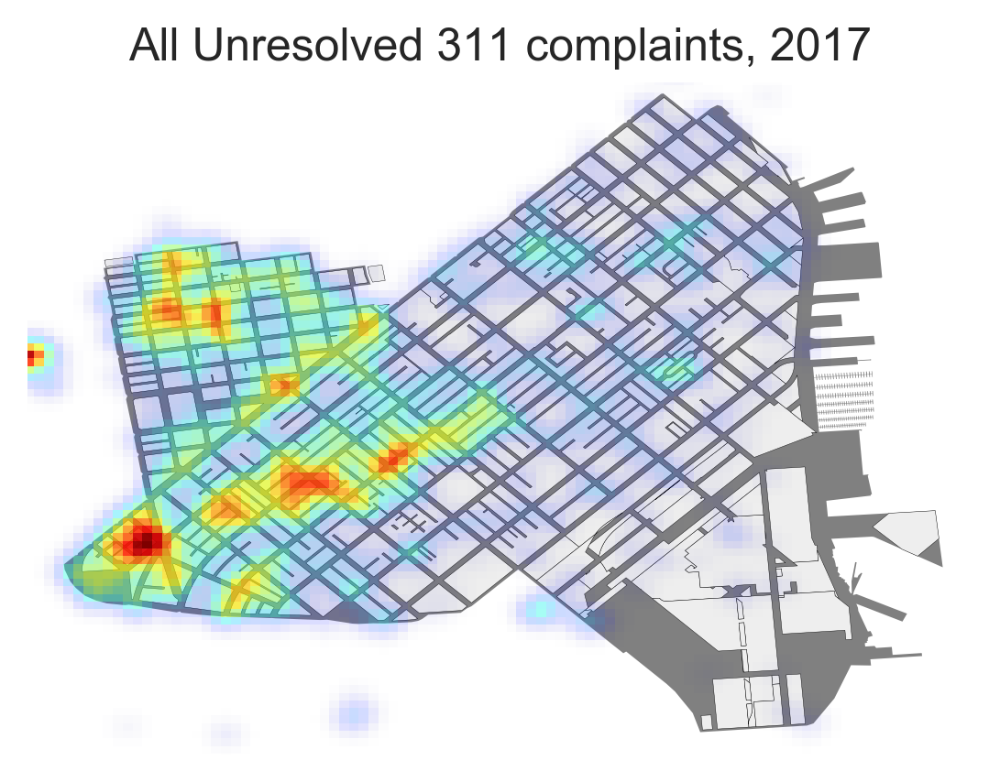

In [25]:
dd = gdf[(gdf['Supervisor District'] == 6) & (pd.isnull(gdf.Closed))]
f, ax = d6_heatmap(dd, 'All Unresolved 311 complaints, 2017', bins=(192, 192))
f.set_size_inches(4, 6)
maputils.save_map(f, ax, "figs/heatmap-2017-unresolved-complaints.png")

In [26]:
print(len(gdf[(gdf['Supervisor District'] == 6)]))
print(len(gdf[(gdf['Supervisor District'] == 6) & (pd.notnull(gdf.Closed))]))

80625
73773


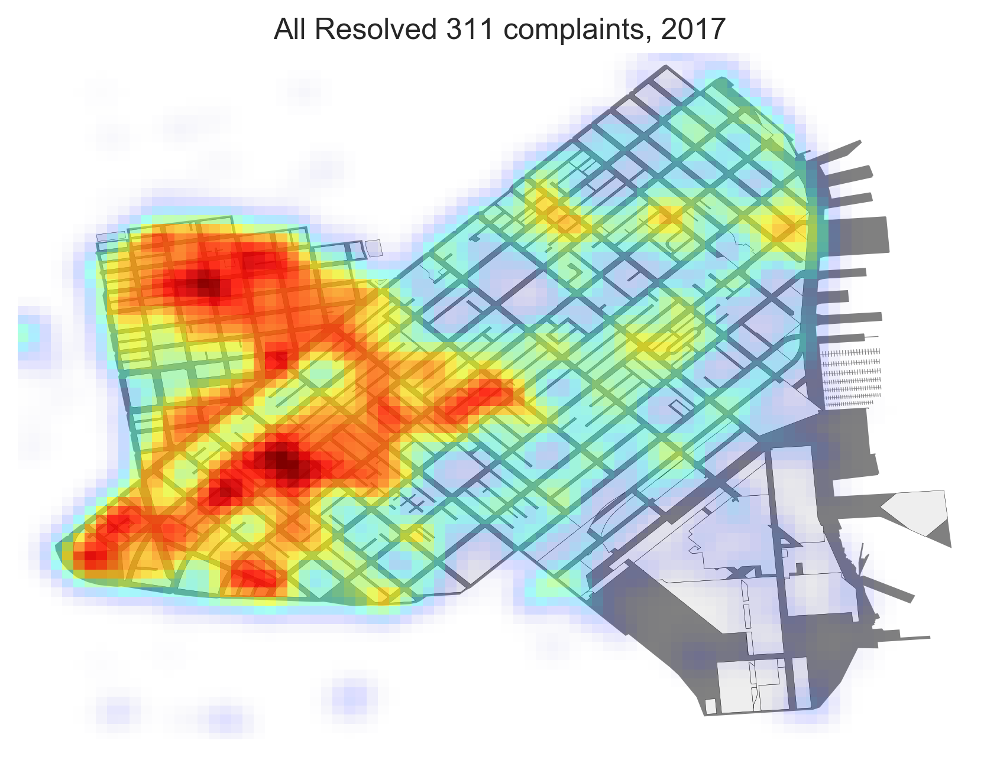

In [27]:
dd = gdf[(gdf['Supervisor District'] == 6) & (pd.notnull(gdf.Closed))]
f, ax = d6_heatmap(dd, 'All Resolved 311 complaints, 2017', bins=(256, 256))
f.set_size_inches(6, 6)
maputils.save_map(f, ax, "figs/heatmap-2017-resolved-complaints.png")